In [1]:
# Note: This notebook was running on google colab, thewre may be some errors with
# dependencies

In [2]:
 # Start from installing kaggle
 !pip install -q kaggle

In [3]:
!mkdir ~/.kaggle

In [4]:
!cp kaggle.json ~/.kaggle/

In [5]:
# Download dataset
!kaggle datasets download -d khlaifiabilel/military-aircraft-recognition-dataset

100% 1.12G/1.13G [00:59<00:00, 16.9MB/s]
100% 1.13G/1.13G [00:59<00:00, 20.4MB/s]


In [6]:
# Unzip dataset to data folder
!unzip military-aircraft-recognition-dataset.zip -d "data"

Показано результат, скорочений до останніх рядків (5000).
  inflating: data/Annotations/Oriented Bounding Boxes/3416.xml  
  inflating: data/Annotations/Oriented Bounding Boxes/3417.xml  
  inflating: data/Annotations/Oriented Bounding Boxes/3418.xml  
  inflating: data/Annotations/Oriented Bounding Boxes/3419.xml  
  inflating: data/Annotations/Oriented Bounding Boxes/342.xml  
  inflating: data/Annotations/Oriented Bounding Boxes/3420.xml  
  inflating: data/Annotations/Oriented Bounding Boxes/3421.xml  
  inflating: data/Annotations/Oriented Bounding Boxes/3422.xml  
  inflating: data/Annotations/Oriented Bounding Boxes/3423.xml  
  inflating: data/Annotations/Oriented Bounding Boxes/3424.xml  
  inflating: data/Annotations/Oriented Bounding Boxes/3425.xml  
  inflating: data/Annotations/Oriented Bounding Boxes/3426.xml  
  inflating: data/Annotations/Oriented Bounding Boxes/3427.xml  
  inflating: data/Annotations/Oriented Bounding Boxes/3428.xml  
  inflating: data/Annotations/Ori

In [11]:
# Paths
ROOT_DIR = "data/"
IMAGE_DIR = ROOT_DIR + "JPEGImages/"
IMAGE_DIR_AFTER_COPY =  "data for yolo/images/test/"
HORIZONTAL_BB = ROOT_DIR + "Annotations/Horizontal Bounding Boxes/"
ORIENTED_BB = ROOT_DIR + "Annotations/Oriented Bounding Boxes/"

TRAIN_SET_TXT = ROOT_DIR + "ImageSets/Main/train.txt"
TEST_SET_TXT = ROOT_DIR + "ImageSets/Main/test.txt"

MODEL_WEIGHTS = "weights best.pt"
MODEL_RESULTS = "results.csv"
MODEL_RESULTS_PNG = "results.png"

In [8]:
# Imports
import random
import os
import xml.etree.ElementTree as ET
import shutil
import yaml
import csv

import cv2
import pandas as pd
import numpy as np
import seaborn as sns

from matplotlib import pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid

In [9]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 644.5/644.5 kB 12.7 MB/s eta 0:00:00


In [10]:
# Clone yolo git repo
!git clone https://github.com/ultralytics/yolov5  # clone
!pip install -r yolov5/requirements.txt  # install


Cloning into 'yolov5'...
remote: Enumerating objects: 16008, done.
remote: Counting objects: 100% (41/41), done.
remote: Compressing objects: 100% (28/28), done.
remote: Total 16008 (delta 22), reused 20 (delta 13), pack-reused 15967
Receiving objects: 100% (16008/16008), 14.60 MiB | 14.73 MiB/s, done.
Resolving deltas: 100% (10988/10988), done.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 190.0/190.0 kB 4.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 9.0 MB/s eta 0:00:00


In [12]:
# Read training csv file

training_df = pd.read_csv(MODEL_RESULTS)

In [ ]:
def plot_loss(loss_name: str):
  # Box loss
  train_values = training_df[f'      train/{loss_name}_loss']
  val_values = training_df[f'        val/{loss_name}_loss']

  # Generate a sequence of integers to represent the epoch numbers
  epochs = range(len(train_values))

  # Plot and label the training and validation loss values
  plt.plot(epochs, train_values, label=f'Training {loss_name} Loss')
  plt.plot(epochs, val_values, label=f'Validation {loss_name} Loss')

  # Add in a title and axes labels
  plt.title(f'Training and Validation {loss_name} Loss')
  plt.xlabel('Epochs')
  plt.ylabel('Loss')

  # Set the tick locations
  # plt.xticks(np.arange(0, len(epochs), 2))

  # Display the plot
  plt.legend(loc='best')
  plt.show()

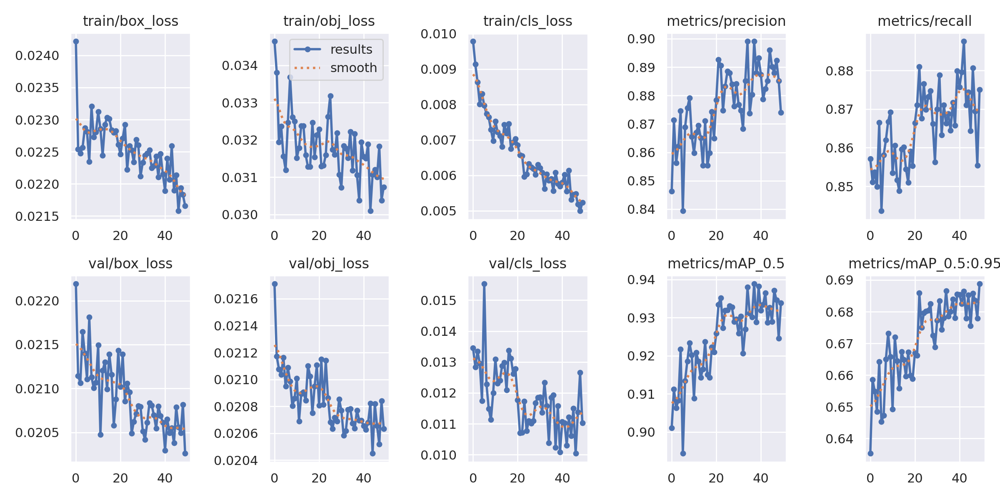

In [13]:
# Display statistics
from IPython.display import Image
Image(MODEL_RESULTS_PNG)

Text(0.5, 1.0, 'Recall')

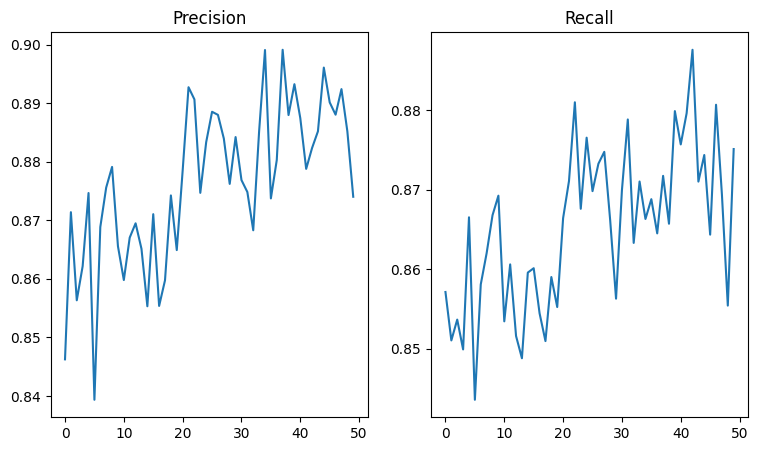

In [14]:
import numpy as np
import matplotlib.pyplot as plt

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(9, 5))
axes[0].plot(training_df['   metrics/precision'])
axes[0].set_title('Precision')
axes[1].plot(training_df['      metrics/recall'])
axes[1].set_title('Recall')

In [15]:
# Helping functions
# Displaying images

def get_image(image_path: str):
    img = cv2.imread(image_path)
    return cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

def get_image_shape(image_path: str):
    img = cv2.imread(image_path)
    return img.shape

def get_image_from_id(obj_id: str, root_path=IMAGE_DIR):
    image_path = root_path + obj_id + ".jpg"
    return get_image(image_path)

def display_image(image_name: str):
    image_path = IMAGE_DIR + image_name
    plt.imshow(get_image(image_path))

def get_random_img_names():
    return random.sample(os.listdir(IMAGE_DIR), 16)

In [16]:
# Reading xml files
# XML reader
def parse_xml(xml_file_path: str):
    # Parses xml file, returns dict
    tree = ET.parse(xml_file_path)

    filename = tree.find('filename').text
    img_size = {
        'width': int(tree.find('size').find('width').text),
        'height': int(tree.find('size').find('height').text),
        'depth': int(tree.find('size').find('depth').text)
    }
    segmented = int(tree.find('segmented').text)
    bboxes = []
    for obj in tree.findall('object'):
        bndbox = obj.find('bndbox')
        bboxes.append({
            'name': obj.find('name').text,
            'xmin': int(bndbox.find('xmin').text),
            'ymin': int(bndbox.find('ymin').text),
            'xmax': int(bndbox.find('xmax').text),
            'ymax': int(bndbox.find('ymax').text)
        })
    database = tree.find('source').find('database').text

    return {
        'filename': filename,
        'img_size': img_size,
        'segmented': segmented,
        'bboxes': bboxes,
        'database': database
    }

def get_xml_file_path(filename, option='HORIZONTAL'):
    if option == 'HORIZONTAL':
        return HORIZONTAL_BB + filename
    elif option == 'ORIENTED':
        return ORIENTED_BB + filename

In [17]:
# Convert classes to classes_map for YOLO model
classes = ['A19', 'A1', 'A20', 'A16', 'A5', 'A13', 'A15', 'A3', 'A17', 'A11',
       'A14', 'A8', 'A2', 'A10', 'A9', 'A4', 'A18', 'A7', 'A12', 'A6']

classes_map = {item: index for index, item in enumerate(classes)}
classes_map

{'A19': 0,
 'A1': 1,
 'A20': 2,
 'A16': 3,
 'A5': 4,
 'A13': 5,
 'A15': 6,
 'A3': 7,
 'A17': 8,
 'A11': 9,
 'A14': 10,
 'A8': 11,
 'A2': 12,
 'A10': 13,
 'A9': 14,
 'A4': 15,
 'A18': 16,
 'A7': 17,
 'A12': 18,
 'A6': 19}

In [18]:
# Get train and test ids
def get_train_set_ids():
    with open(TRAIN_SET_TXT, 'r') as file:
        ids = file.read().splitlines()
    return ids

def get_test_set_ids():
    with open(TEST_SET_TXT, 'r') as file:
        ids = file.read().splitlines()
    return ids

train_set_ids = get_train_set_ids()
test_set_ids = get_test_set_ids()
print(f'Size of train set is: {len(train_set_ids)}')
print(f'Size of test set is: {len(test_set_ids)}')
print(f'Total images: {len(train_set_ids) + len(test_set_ids)}')

Size of train set is: 1331
Size of test set is: 2511
Total images: 3842


In [19]:
# Convert the info dict to the required yolo format and write it to disk
def convert_to_yolov5(info_dict, obj_id, save_folder):
    print_buffer = []

    # For each bounding box
    for b in info_dict["bboxes"]:
        try:
            class_id = classes_map[b["name"]]
        except KeyError:
            print("Invalid Class. Must be one from ", classes_map.keys())

        # Transform the bbox co-ordinates as per the format required by YOLO v5
        b_center_x = (b["xmin"] + b["xmax"]) / 2
        b_center_y = (b["ymin"] + b["ymax"]) / 2
        b_width    = (b["xmax"] - b["xmin"])
        b_height   = (b["ymax"] - b["ymin"])

        # Normalise the co-ordinates by the dimensions of the image
        image_h, image_w, image_c = get_image_shape(IMAGE_DIR + obj_id + ".jpg")
        b_center_x /= image_w
        b_center_y /= image_h
        b_width    /= image_w
        b_height   /= image_h

        #Write the bbox details to the file
        print_buffer.append("{} {:.3f} {:.3f} {:.3f} {:.3f}".format(class_id, b_center_x, b_center_y, b_width, b_height))

    # Name of the file which we have to save
    save_file_name = os.path.join(save_folder, obj_id + ".txt")

    # Save the annotation to disk
    # print("\n".join(print_buffer), file= open(save_file_name, "w"))
    with open(save_file_name, 'w') as fl:
      fl.write("\n".join(print_buffer))

In [20]:
# Create appropriate folders
!mkdir "data for yolo"
!mkdir "data for yolo/labels"
!mkdir "data for yolo/images"
!mkdir "data for yolo/labels/train"
!mkdir "data for yolo/labels/test"
!mkdir "data for yolo/images/train"
!mkdir "data for yolo/images/test"

In [21]:
# Convert dataset to yolo format
# for obj_id in train_set_ids:
#   info_dict = parse_xml(HORIZONTAL_BB + str(obj_id) + ".xml")
#   convert_to_yolov5(info_dict, str(obj_id), "data for yolo/labels/train/")

for obj_id in test_set_ids:
  info_dict = parse_xml(HORIZONTAL_BB + str(obj_id) + ".xml")
  convert_to_yolov5(info_dict, str(obj_id), "data for yolo/labels/test/")

In [22]:
# Copy images to YOLO
def move_files_to_folder(list_of_files, destination_folder):
    for f in list_of_files:
        try:
            shutil.move(f, destination_folder)
        except:
            print(f)
            assert False

# train_img_files = [IMAGE_DIR + str(obj_id) + ".jpg" for obj_id in train_set_ids]
test_img_files = [IMAGE_DIR + str(obj_id) + ".jpg" for obj_id in test_set_ids]

# Move the splits into their folders
# move_files_to_folder(train_img_files, 'data for yolo/images/train')
move_files_to_folder(test_img_files, 'data for yolo/images/test')

In [23]:
class_id_to_name_mapping = dict(zip(classes_map.values(), classes_map.keys()))

In [24]:
# Make .yaml file for yolo
d = {
    'path':'../data for yolo/',
    'train': 'images/train',
    'val': 'images/test',
    'nc': 20,
    'names': class_id_to_name_mapping
    }

with open('dataset.yml', 'w') as yaml_file:
    yaml.dump(d, yaml_file, default_flow_style=False)

In [25]:
!python yolov5/val.py --weights "weights best.pt" --verbose --data dataset.yml

val: data=dataset.yml, weights=['weights best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=True, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=yolov5/runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v7.0-227-ge4df1ec Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7064065 parameters, 0 gradients, 15.9 GFLOPs
100% 755k/755k [00:00<00:00, 144MB/s]
val: Scanning /content/data for yolo/labels/test... 2511 images, 0 backgrounds, 0 corrupt: 100% 2511/2511 [00:01<00:00, 1500.46it/s]
val: New cache created: /content/data for yolo/labels/test.cache
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 79/79 [01:20<00:00,  1.02s/it]
                   all       2511      14471      0.883      0.866      0.933      0.694
                   A19     

In [26]:
results = """
all       2511      14471      0.883      0.866      0.933      0.694
A19       2511        717      0.722      0.874      0.864      0.616
A1       2511       1092      0.913      0.705      0.893      0.709
A20       2511        551      0.975      0.866      0.931      0.641
A16       2511       1847      0.989      0.686      0.949      0.717
A5       2511        827      0.871       0.81      0.901      0.608
A13       2511       1091      0.838      0.703      0.856      0.581
A15       2511        418      0.599      0.864      0.812      0.517
A3       2511        860      0.827      0.919      0.943      0.658
A17       2511        958       0.98      0.977       0.99      0.793
A11       2511        356      0.823      0.834      0.888      0.695
A14       2511       1119      0.961      0.808      0.964      0.743
A8       2511        579      0.907      0.908      0.949      0.737
A2       2511        993      0.992      0.848      0.972      0.704
A10       2511        556      0.909      0.986      0.993      0.712
A9       2511        611      0.953      0.922      0.969      0.713
A4       2511        463      0.828      0.775      0.892      0.684
A18       2511        148      0.795      0.926      0.936      0.737
A7       2511        489      0.871      0.986      0.979      0.769
A12       2511        462      0.939      0.939      0.979      0.769
A6       2511        334      0.977      0.982      0.993      0.769
"""

results_by_classes = []
for res in results.split("\n"):
  if len(res.replace(' ', '')) > 0:
    results_by_classes.append([st.replace(' ', '') for st in res.split("     ")])

In [27]:
precision_dict = {}
for res in results_by_classes:
  precision_dict[res[0]] = float(res[3])

recall_dict = {}
for res in results_by_classes:
  recall_dict[res[0]] = float(res[4])

f1_dict = {}
for res in recall_dict:
  f1_dict[res] = 2 * (precision_dict[res] * recall_dict[res]) / (precision_dict[res] + recall_dict[res])

In [28]:
order = list(precision_dict.keys())

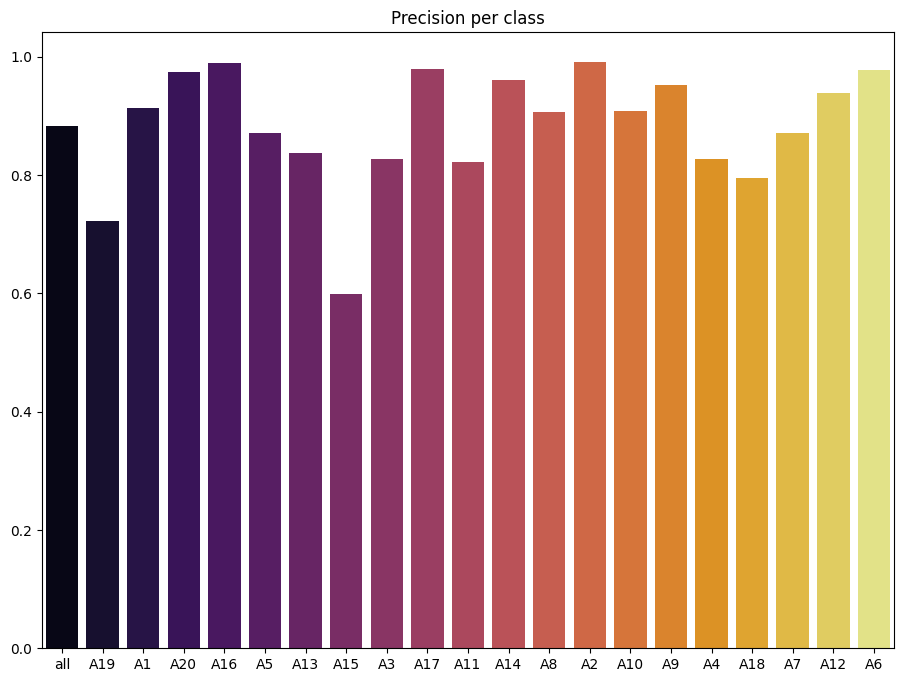

In [30]:
# We can see that the minimal values is for A15, overall everythin is better
# % matplotlib inline
plt.figure(figsize=(11,8))
sns.barplot(x=list(precision_dict.keys()), y=list(precision_dict.values()), order=order, palette='inferno', ).set(title="Precision per class")
plt.show()

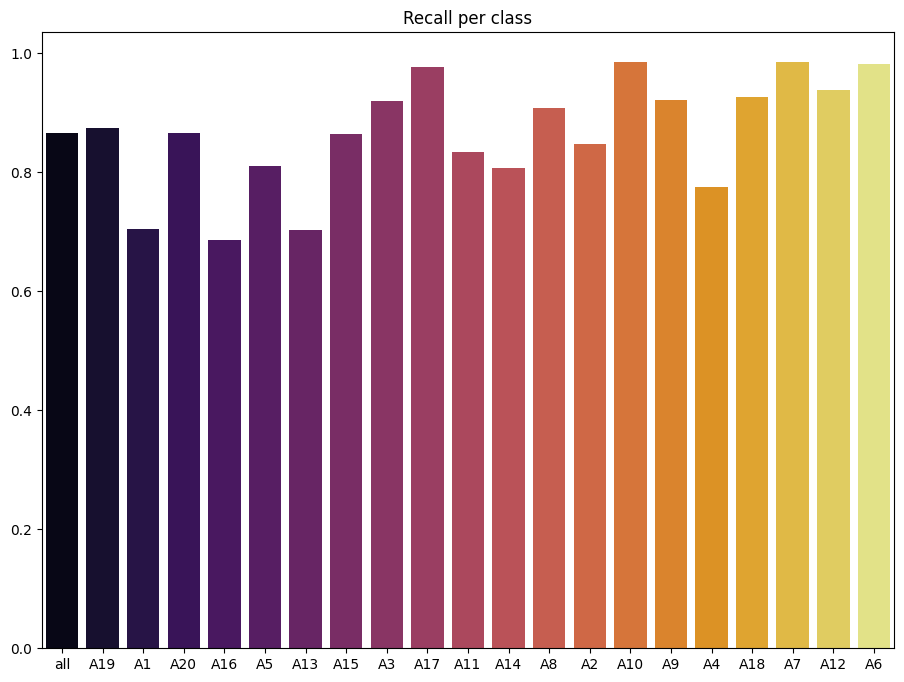

In [31]:
# We can see that the minimal values is for A20 and largets value is for A4
# % matplotlib inline
plt.figure(figsize=(11,8))
sns.barplot(x=list(recall_dict.keys()), y=list(recall_dict.values()), order=order, palette='inferno', ).set(title="Recall per class")
plt.show()

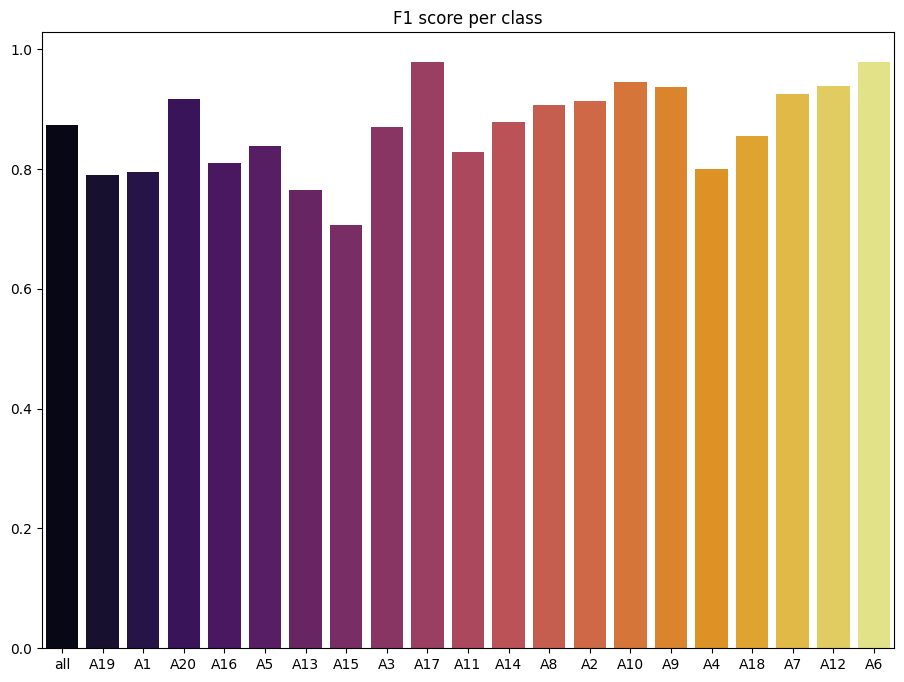

In [32]:
# We can see that the minimal values is for A20 and largets value is for A4
# % matplotlib inline
plt.figure(figsize=(11,8))
sns.barplot(x=list(f1_dict.keys()), y=list(f1_dict.values()), order=order, palette='inferno', ).set(title="F1 score per class")
plt.show()

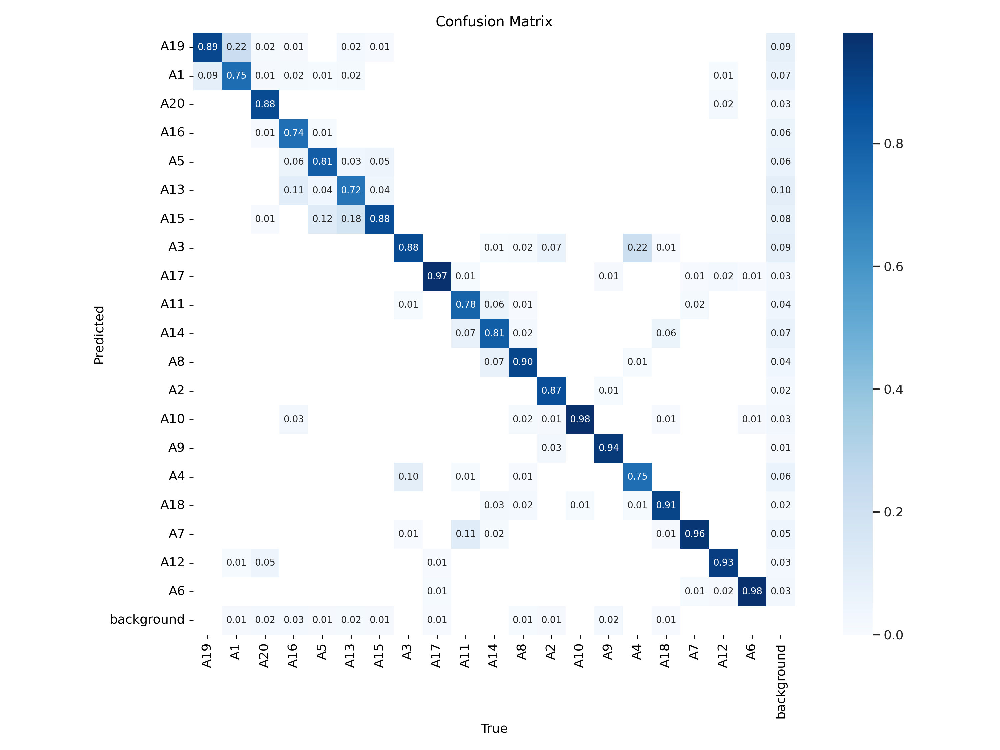

In [33]:
from IPython.display import Image
Image("yolov5/runs/val/exp/confusion_matrix.png")

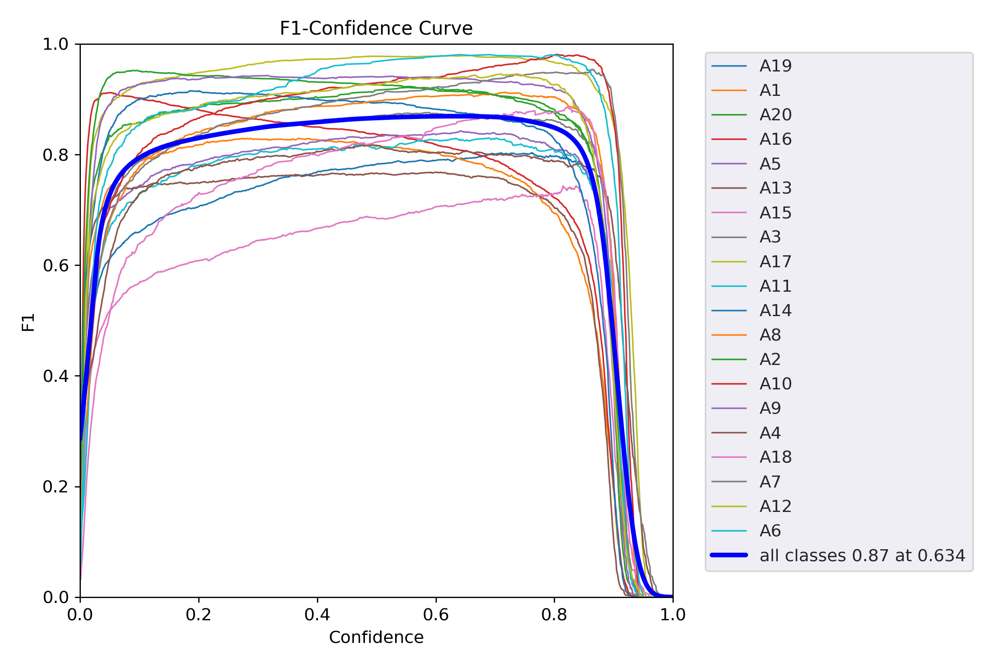

In [34]:
from IPython.display import Image
Image("yolov5/runs/val/exp/F1_curve.png")

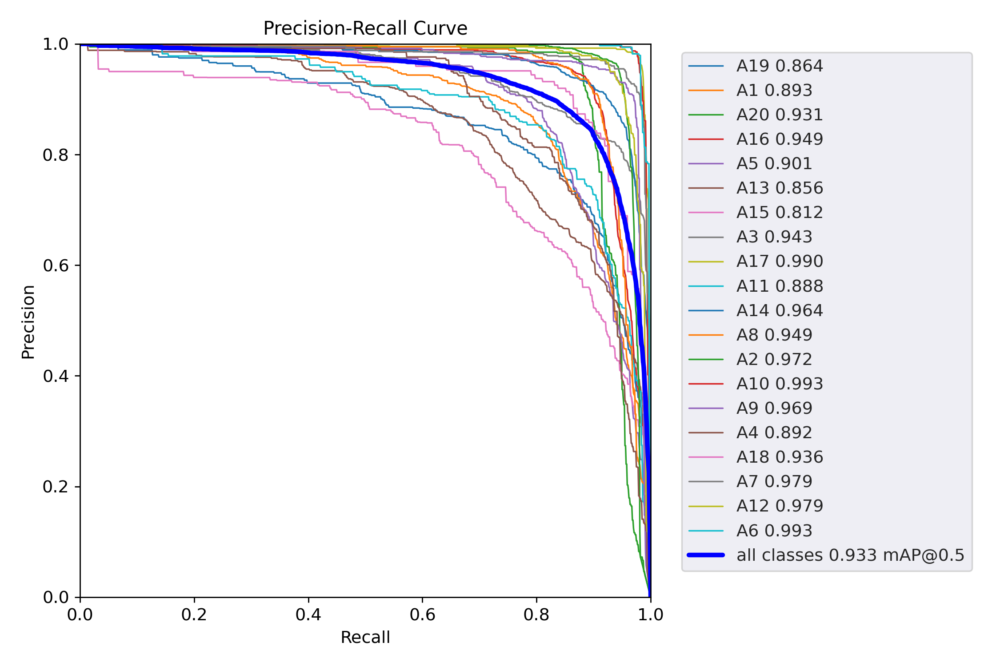

In [35]:
from IPython.display import Image
Image("yolov5/runs/val/exp/PR_curve.png")

In [36]:
val_objects = []
for obj_id in test_set_ids:
  info_dict = parse_xml(HORIZONTAL_BB + str(obj_id) + ".xml")
  info_dict["obj_id"] = obj_id
  val_objects.append(info_dict)

In [37]:
# YOLOv5 PyTorch HUB Inference (DetectionModels only)
import torch

model = torch.hub.load('ultralytics/yolov5', 'custom',
                       path=MODEL_WEIGHTS,
                       force_reload=True)  # or yolov5n - yolov5x6 or custom

/usr/local/lib/python3.10/dist-packages/torch/hub.py:286: UserWarning: You are about to download and run code from an untrusted repository. In a future release, this won't be allowed. To add the repository to your trusted list, change the command to {calling_fn}(..., trust_repo=False) and a command prompt will appear asking for an explicit confirmation of trust, or load(..., trust_repo=True), which will assume that the prompt is to be answered with 'yes'. You can also use load(..., trust_repo='check') which will only prompt for confirmation if the repo is not already trusted. This will eventually be the default behaviour
  warnings.warn(
Downloading: "https://github.com/ultralytics/yolov5/zipball/master" to /root/.cache/torch/hub/master.zip
YOLOv5 🚀 2023-10-15 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7064065 parameters, 0 gradients, 15.9 GFLOPs
Adding AutoShape... 


In [38]:
# Visualization
def get_bounding_boxes(obj_id: str):
    fpath = get_xml_file_path(str(obj_id) + ".xml")
    xml_parsed = parse_xml(fpath)
    bounding_boxes = xml_parsed["bboxes"]

    return bounding_boxes

def draw_boxes(image, bounding_boxes: list):
    for bbox in bounding_boxes:
        image = cv2.rectangle(image, (bbox['xmin'], bbox['ymin']), (bbox['xmax'], bbox['ymax']), (255,0,0), 2)
        cv2.putText(image, bbox['name'], (bbox['xmax'], bbox['ymax']+10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255,20,20), 3)

    return image

def display_grid_with_bboxes(obj_ids_list: list):
    # Displays 4 x 4 grid
    #     images = [get_image(name) for name in image_names_list]

    fig = plt.figure(figsize=(16., 16.))
    grid = ImageGrid(fig, 111,  # similar to subplot(111)
                     nrows_ncols=(4, 4),  # creates 2x2 grid of axes
                     axes_pad=0.2,  # pad between axes in inch.
                     )

    for ax, im_name in zip(grid, obj_ids_list):
        # Iterating over the grid returns the Axes.
        bboxes = get_bounding_boxes(str(im_name))
        # print(bboxes)
        img = get_image_from_id(str(im_name), IMAGE_DIR_AFTER_COPY)
        img = model([img]).render()[0]
        # print(img)
        ax.imshow(draw_boxes(img, bboxes))

In [39]:
A15_objects = []
for obj in val_objects:
  for bbox in obj['bboxes']:
    if bbox['name'] == 'A15':
      A15_objects.append(obj['obj_id'])
      break

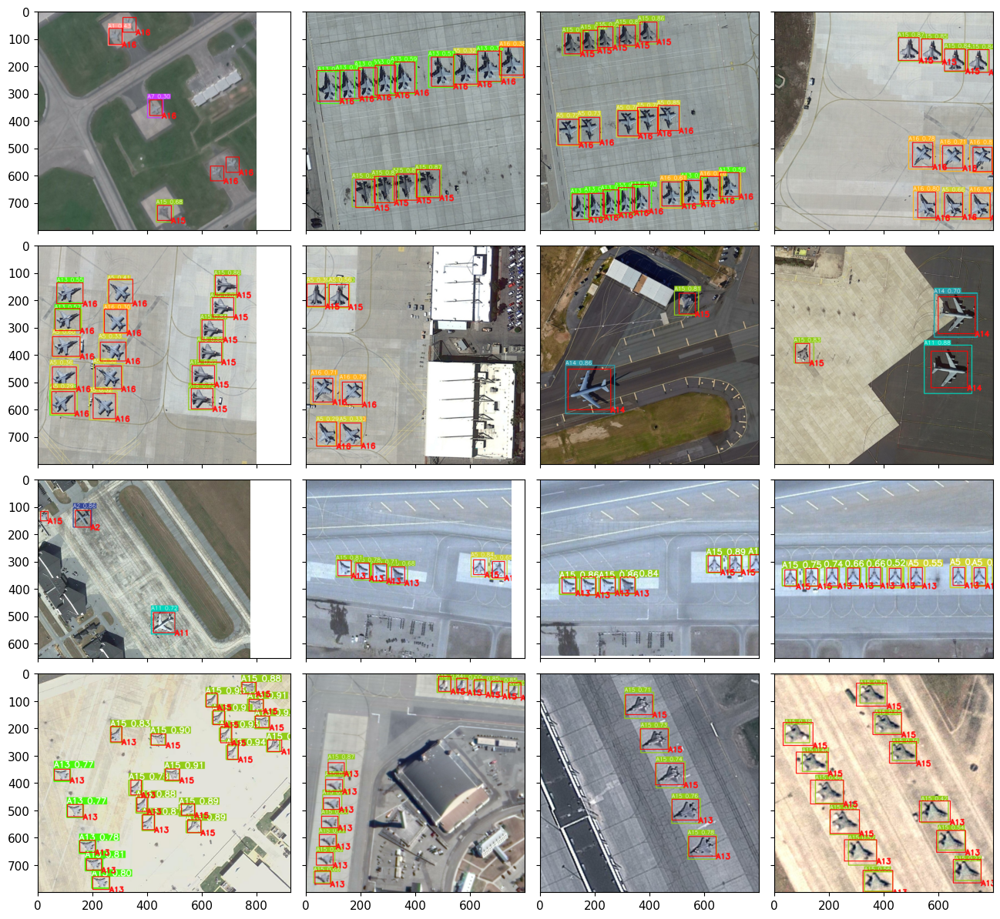

In [40]:
%matplotlib inline
display_grid_with_bboxes(A15_objects)
plt.show()

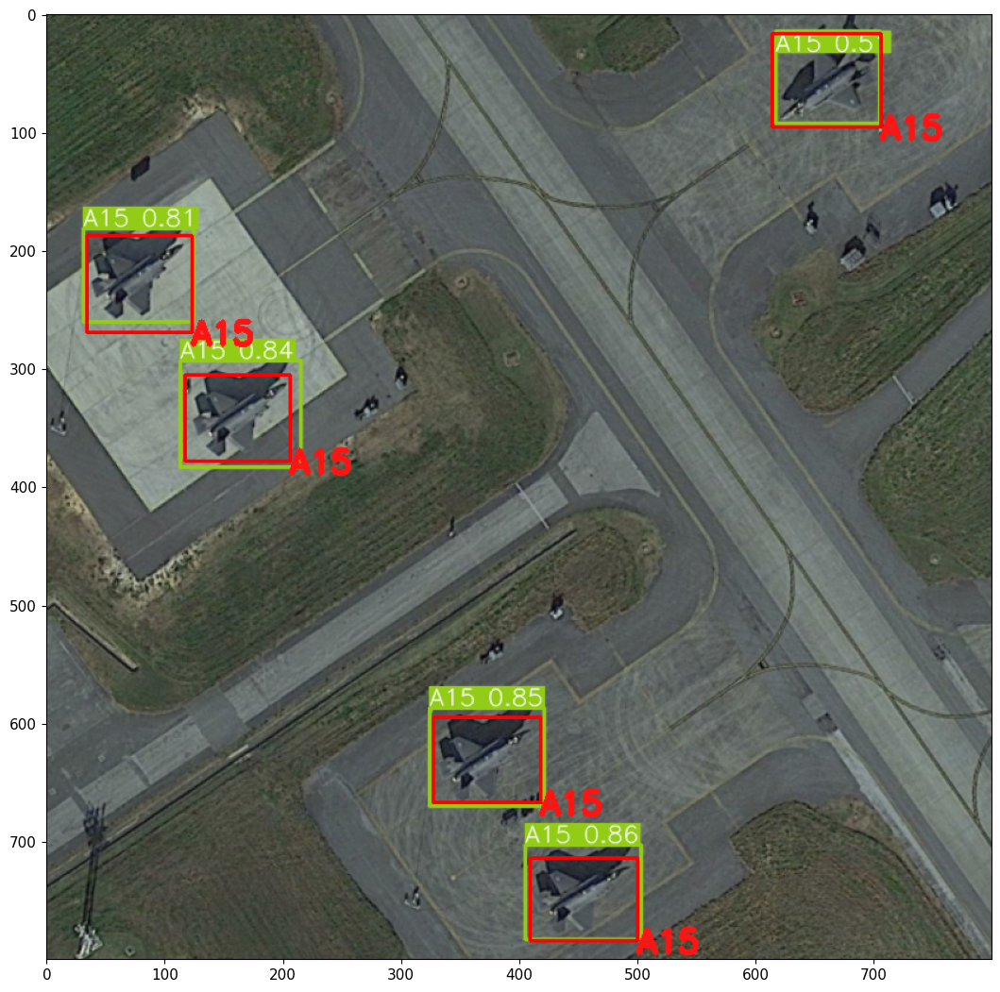

In [41]:
random_name = '1053'

bboxes = get_bounding_boxes(str(random_name))
img = get_image_from_id(str(random_name), IMAGE_DIR_AFTER_COPY)
results = model([img])

img = model([img]).render()[0]
fig = plt.figure(figsize=(13,13))
plt.imshow(draw_boxes(img, bboxes))

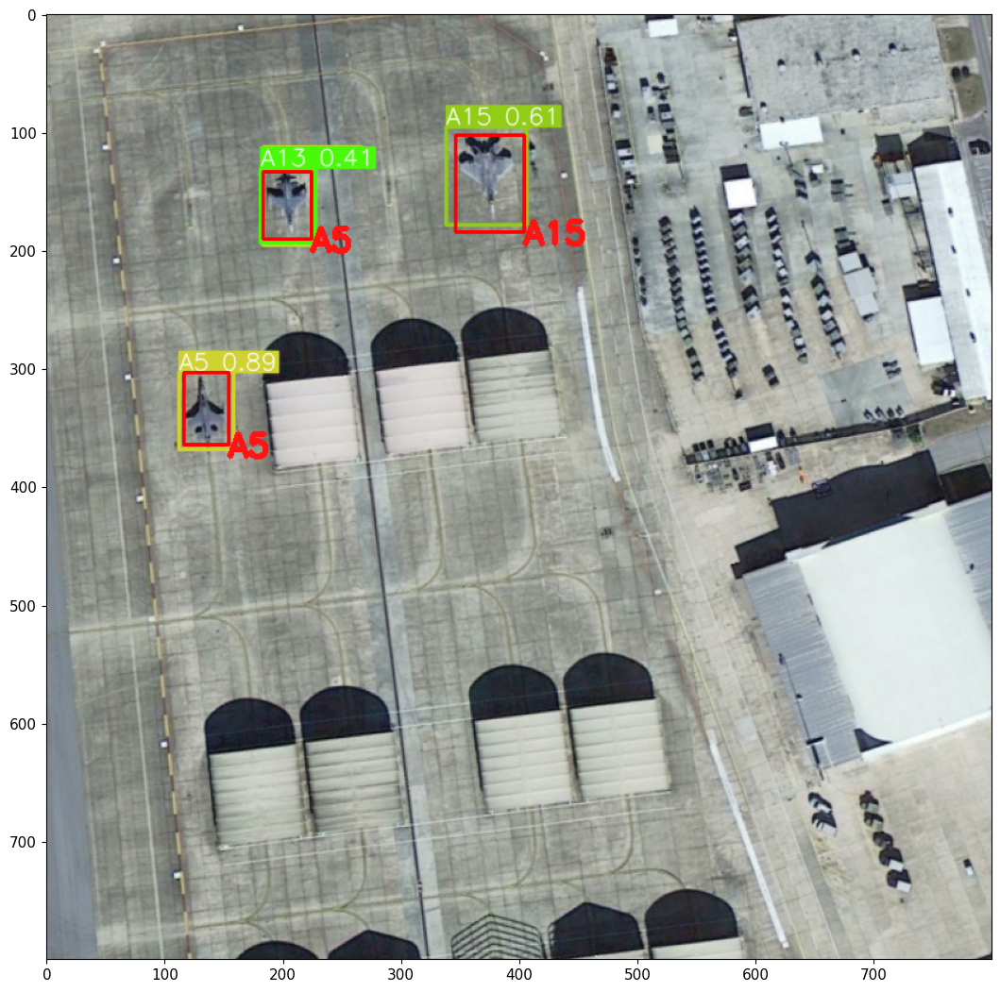

In [73]:
random_name = random.choice(A15_objects)

bboxes = get_bounding_boxes(str(random_name))
img = get_image_from_id(str(random_name), IMAGE_DIR_AFTER_COPY)
results = model([img])

img = model([img]).render()[0]
fig = plt.figure(figsize=(13,13))
plt.imshow(draw_boxes(img, bboxes))

In [78]:
random_name

'1125'

In [ ]:
interesting_points = ['146', '1086', '1053', '546']

In [ ]:
random_name

'583'

In [ ]:
interesting_images = ['1281']

In [70]:
missclisified_ids = []
for i in range(0, len(val_objects) - 32, 16):
  # Form batch of images
  imgs = []
  names_from_obj = []
  ids = []
  for j in (i, i+16):
    img = get_image_from_id(str(val_objects[j]['obj_id']), IMAGE_DIR_AFTER_COPY)
    imgs.append(img)
    ids.append(val_objects[j]['obj_id'])
    names_from_obj.append([bbox['name'] for bbox in val_objects[j]['bboxes']])

  results = model(imgs)
  results_pandas = results.pandas()
  for t in range(len(ids)):
    obj_results = list(results_pandas.xyxy[t]['name'])
    if sorted(obj_results) != sorted(names_from_obj[t]):
      missclisified_ids.append(ids[t])
  if len(missclisified_ids) <= 25:
    print(missclisified_ids)

[]
['1025']
['1025', '1025', '3193']
['1025', '1025', '3193', '3193', '2408']
['1025', '1025', '3193', '3193', '2408', '2408']
['1025', '1025', '3193', '3193', '2408', '2408']
['1025', '1025', '3193', '3193', '2408', '2408', '2192']
['1025', '1025', '3193', '3193', '2408', '2408', '2192', '2192', '2776']
['1025', '1025', '3193', '3193', '2408', '2408', '2192', '2192', '2776', '2776', '3278']
['1025', '1025', '3193', '3193', '2408', '2408', '2192', '2192', '2776', '2776', '3278', '3278', '3682']
['1025', '1025', '3193', '3193', '2408', '2408', '2192', '2192', '2776', '2776', '3278', '3278', '3682', '3682']
['1025', '1025', '3193', '3193', '2408', '2408', '2192', '2192', '2776', '2776', '3278', '3278', '3682', '3682']
['1025', '1025', '3193', '3193', '2408', '2408', '2192', '2192', '2776', '2776', '3278', '3278', '3682', '3682']
['1025', '1025', '3193', '3193', '2408', '2408', '2192', '2192', '2776', '2776', '3278', '3278', '3682', '3682']
['1025', '1025', '3193', '3193', '2408', '2408',

In [71]:
len(missclisified_ids)

140

153


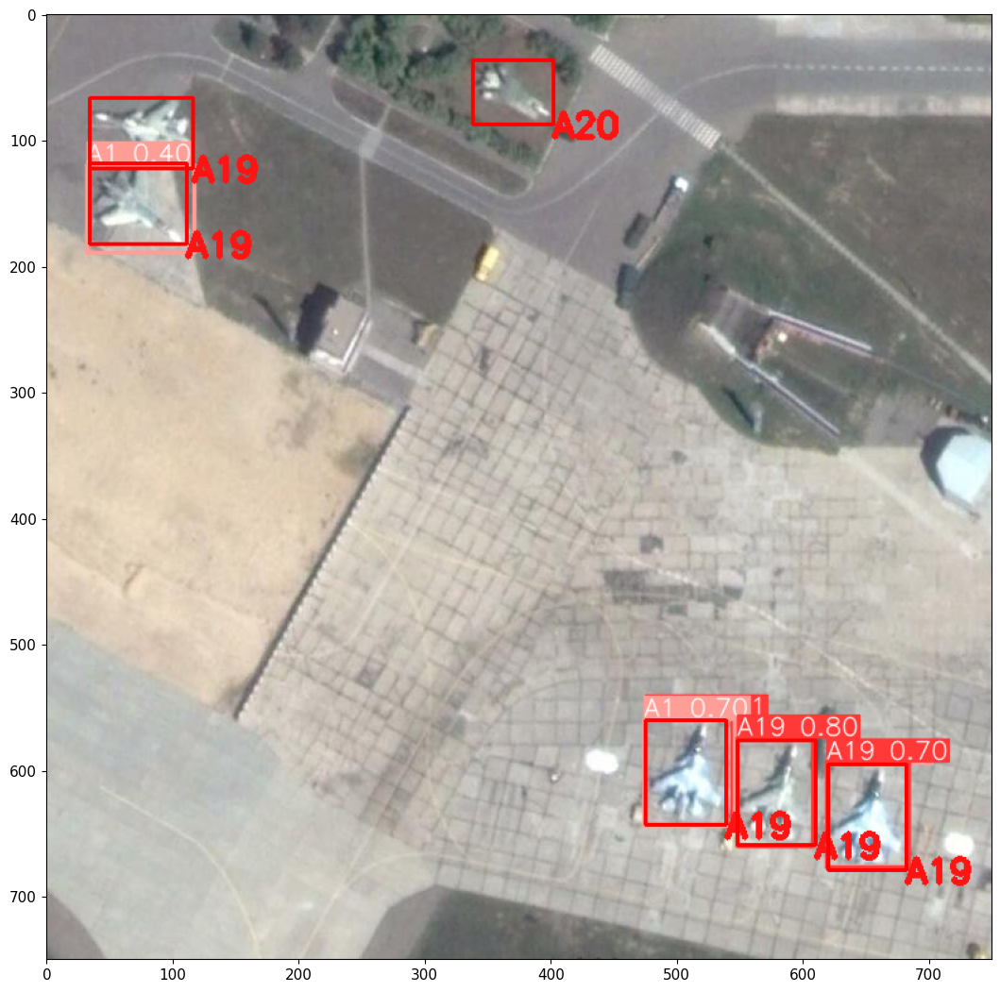

In [98]:
random_name = random.choice(missclisified_ids)

bboxes = get_bounding_boxes(str(random_name))
img = get_image_from_id(str(random_name), IMAGE_DIR_AFTER_COPY)
results = model([img])

img = model([img]).render()[0]
fig = plt.figure(figsize=(13,13))
plt.imshow(draw_boxes(img, bboxes))
print(random_name)

In [ ]:
special_cases = ['3108', '170']

1288


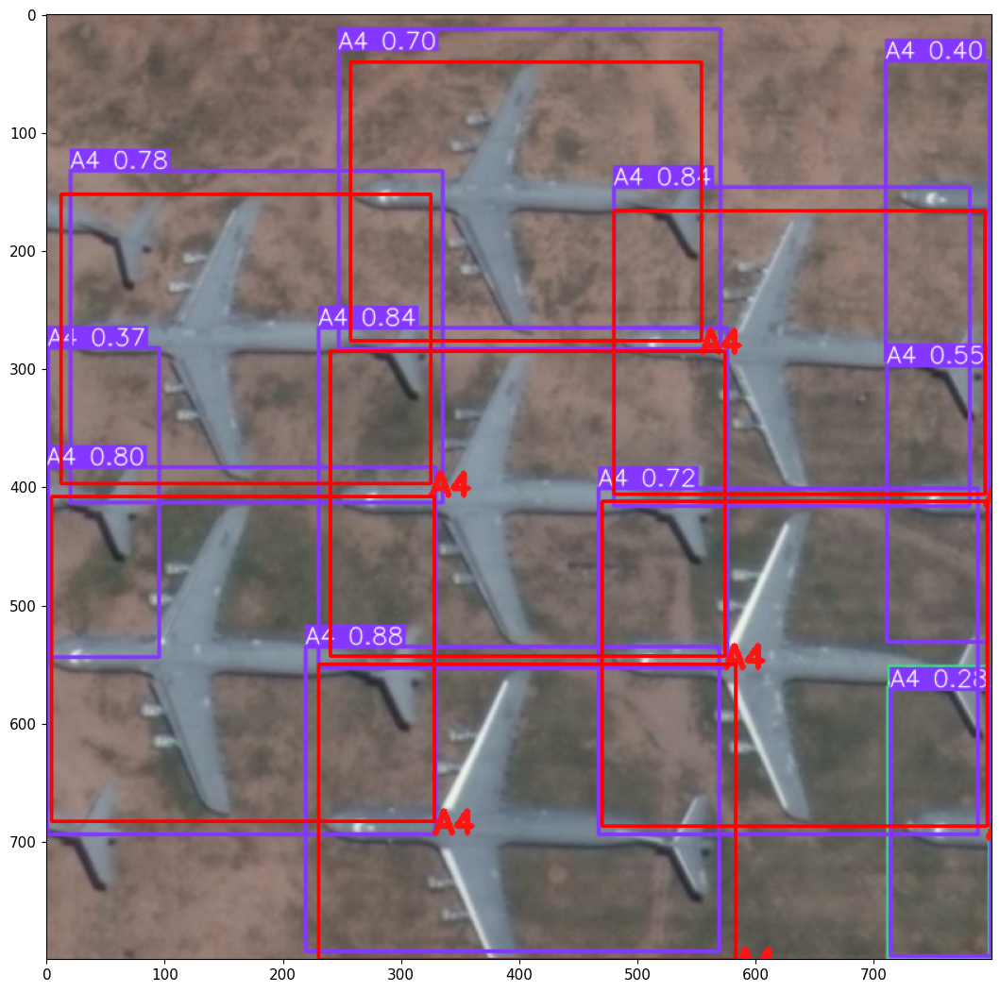

In [90]:
random_name = '1288'

bboxes = get_bounding_boxes(str(random_name))
img = get_image_from_id(str(random_name), IMAGE_DIR_AFTER_COPY)
results = model([img])

img = model([img]).render()[0]
fig = plt.figure(figsize=(13,13))
plt.imshow(draw_boxes(img, bboxes))
print(random_name)